Načtení potřebných knihoven Pythonu

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import sqlalchemy
import folium
from folium import plugins

Načtení tabulky s údaji o vypůjčkách kol

In [2]:
bikes_df = pd.read_csv('edinburgh_bikes.csv')
bikes_df

,Unnamed: 0,index,started_at,ended_at,duration,start_station_id,start_station_name,start_station_description,start_station_latitude,start_station_longitude,end_station_id,end_station_name,end_station_description,end_station_latitude,end_station_longitude
0,0,0,2018-09-15 08:52:05,2018-09-15 09:11:48,1182,247,Charlotte Square,North Corner of Charlotte Square,55.952335,-3.207101,259,St Andrew Square,North East corner,55.954728,-3.192653
1,1,1,2018-09-15 09:24:33,2018-09-15 09:41:09,995,259,St Andrew Square,North East corner,55.954749,-3.192774,262,Canonmills,near Tesco's,55.962804,-3.196284
2,2,2,2018-09-15 09:48:54,2018-09-15 10:46:40,3466,262,Canonmills,near Tesco's,55.962804,-3.196284,250,Victoria Quay,Entrance to Scottish Government Office,55.977638,-3.174116
3,3,3,2018-09-16 12:01:36,2018-09-16 12:25:26,1430,255,Kings Buildings 4,X-Y Cafe,55.922001,-3.176902,254,Kings Building 3,Kings Building House,55.923479,-3.175385
4,4,4,2018-09-16 12:03:43,2018-09-16 12:11:16,452,255,Kings Buildings 4,X-Y Cafe,55.922001,-3.176902,253,Kings Building 2,Sanderson Building,55.923202,-3.171646
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
438254,438254,12636,2021-06-30 23:30:31,2021-07-01 00:06:10,2139,1090,Hillside Crescent,East end of Hillside Crescent,55.957872,-3.175888,1728,Portobello - Kings Road,Foot of Kings Road next to the promenade,55.957915,-3.118332
438255,438255,12637,2021-06-30 23:36:16,2021-07-01 00:05:40,1763,1814,Abbeyhill,Near Abbey Mount,55.955248,-3.172216,1728,Portobello - Kings Road,Foot of Kings Road next to the promenade,55.957915,-3.118332
438256,438256,12638,2021-06-30 23:49:03,2021-07-01 00:11:25,1342,256,St Andrews House,beside Jacobs ladder,55.953164,-3.181682,1091,Holyrood Road,Opposite St Leonards Land,55.949560,-3.180413
438257,438257,12639,2021-06-30 23:49:03,2021-07-01 00:11:52,1369,256,St Andrews House,beside Jacobs ladder,55.953164,-3.181682,1091,Holyrood Road,Opposite St Leonards Land,55.949560,-3.180413


In [3]:
bikes_df = bikes_df.drop(['Unnamed: 0', 'index'], axis=1)

In [4]:
bikes_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 438259 entries, 0 to 438258
Data columns (total 13 columns):
 #   Column                     Non-Null Count   Dtype  
---  ------                     --------------   -----  
 0   started_at                 438259 non-null  object 
 1   ended_at                   438259 non-null  object 
 2   duration                   438259 non-null  int64  
 3   start_station_id           438259 non-null  int64  
 4   start_station_name         438259 non-null  object 
 5   start_station_description  434118 non-null  object 
 6   start_station_latitude     438259 non-null  float64
 7   start_station_longitude    438259 non-null  float64
 8   end_station_id             438259 non-null  int64  
 9   end_station_name           438259 non-null  object 
 10  end_station_description    433570 non-null  object 
 11  end_station_latitude       438259 non-null  float64
 12  end_station_longitude      438259 non-null  float64
dtypes: float64(4), int64(3), obje

Vidím, že časové údaje o začátku a konci půjčení kola jsou typu object a je potřeba je převést na datetime typ, aby s nimi bylo možné dále pracovat. U ostatních záznamů to vypadá, že datové typy jsou v pořádku.

In [5]:
bikes_df['started_at'] = pd.to_datetime(bikes_df['started_at'])
bikes_df['ended_at'] = pd.to_datetime(bikes_df['ended_at'])

In [6]:
bikes_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 438259 entries, 0 to 438258
Data columns (total 13 columns):
 #   Column                     Non-Null Count   Dtype         
---  ------                     --------------   -----         
 0   started_at                 438259 non-null  datetime64[ns]
 1   ended_at                   438259 non-null  datetime64[ns]
 2   duration                   438259 non-null  int64         
 3   start_station_id           438259 non-null  int64         
 4   start_station_name         438259 non-null  object        
 5   start_station_description  434118 non-null  object        
 6   start_station_latitude     438259 non-null  float64       
 7   start_station_longitude    438259 non-null  float64       
 8   end_station_id             438259 non-null  int64         
 9   end_station_name           438259 non-null  object        
 10  end_station_description    433570 non-null  object        
 11  end_station_latitude       438259 non-null  float64 

In [7]:
bikes_df.isna().any()

started_at                   False
ended_at                     False
duration                     False
start_station_id             False
start_station_name           False
start_station_description     True
start_station_latitude       False
start_station_longitude      False
end_station_id               False
end_station_name             False
end_station_description       True
end_station_latitude         False
end_station_longitude        False
dtype: bool

Kontrola chybějících hodnot. Hodnoty chybí jen ve sloupích s popisem stanic, které ale nejsou důležité.

Rozdělení času a datumů, pro jednodušší pozdější práci.

In [8]:
bikes_df['started_date'] = bikes_df['started_at'].dt.date
bikes_df['started_time'] = bikes_df['started_at'].dt.time
bikes_df['started_weekend'] = bikes_df['started_at'].dt.weekday
bikes_df['started_year'] = bikes_df['started_at'].dt.year
bikes_df['started_month'] = bikes_df['started_at'].dt.month
bikes_df['started_day'] = bikes_df['started_at'].dt.day

bikes_df['ended_date'] = bikes_df['ended_at'].dt.date
bikes_df['ended_time'] = bikes_df['ended_at'].dt.time
bikes_df['ended_weekend'] = bikes_df['ended_at'].dt.weekday
bikes_df['ended_year'] = bikes_df['ended_at'].dt.year
bikes_df['ended_month'] = bikes_df['ended_at'].dt.month
bikes_df['ended_day'] = bikes_df['ended_at'].dt.day

# Identifikujte aktivní a neaktivní stanice

Pro kontrolu aktivity stanic jsem zvolil rok 2021, protože se zde dá nejlíp porovnat aktivita oproti minulým rokům. Použiji modul folium pro zobrazení výsledků na mapě. Nachystal jsem tabulku, která obsahuje souřadnice jednotlivých stanic, id stanic a rozdělení podle roku kdy byla/je stanice aktivní. Na mapu jsem přidal tlačítko pro odblokování zoomu, rozdělení do skupin (aktivní v roce 2021 a neaktivní stanice), počet příjezdů a výjezdů ze stanic za celou dobu jejich fungování. Okolo každé stanice je kruh, který znázorňuje aktivitu stanice.

In [9]:
active_df = (bikes_df[['start_station_id', 'start_station_name', 'start_station_latitude', 'start_station_longitude', 'started_year']]
    .assign(start_rides=1)
    .groupby('start_station_name')
    .agg({'start_station_latitude': 'max', 'start_station_longitude': 'max', 'start_station_id': 'max', 'started_year': 'max', 'start_rides': 'sum'})
    .rename(columns={'start_station_latitude': 'lat', 'start_station_longitude': 'lng','start_station_id': 'station_id'})
    .rename_axis('station')
    )

In [10]:
end_rides = bikes_df[['end_station_name', 'ended_at']].groupby('end_station_name').count().rename(columns={'ended_at': 'end_rides'}).rename_axis('station')

In [11]:
active_df = active_df.join(end_rides).fillna(0)


In [15]:
active_map = folium.Map(active_df[['lat', 'lng']].mean(), width='90%', height='100%', zoom_start=11.5)
plugins.ScrollZoomToggler().add_to(active_map)

fg = folium.FeatureGroup(name='stations')
active_map.add_child(fg)

g1 = plugins.FeatureGroupSubGroup(fg, 'active in 2021')
active_map.add_child(g1)

g2 = plugins.FeatureGroupSubGroup(fg, 'inactive')
active_map.add_child(g2)


for station, row in active_df.iterrows():
  popup=folium.Popup(f"""ID stanice: {int(row['station_id'])} <br>
                  Nazev stanice: {station} <br>
                  Pocet jizd ze stanice: {int(row['start_rides'])} <br>
                  Pocet prijezdu na stanici: {int(row['end_rides'])}
                  """, max_width=500)
  if row['started_year'] == 2021:
    folium.Marker(row[['lat', 'lng']].values.tolist(),
                  popup=popup,
                  icon=folium.Icon(icon='bicycle', prefix='fa', color='green')
                  ).add_to(g1)
    folium.Circle(row[['lat', 'lng']].values.tolist(), radius=((row['start_rides']/20) - (row['end_rides'])/20), fill=True, color='green').add_to(g1)                                                     
  else:
    folium.Marker(row[['lat', 'lng']].values.tolist(),
                  popup=popup,
                  icon=folium.Icon(icon='ban', prefix='fa', color='red')
                  ).add_to(g2)
    folium.Circle(row[['lat', 'lng']].values.tolist(), radius=((row['start_rides']/20) - (row['end_rides'])/20), fill=True, color='red').add_to(g2)               
  
folium.LayerControl(collapsed=False).add_to(active_map)

active_map

Na mapě je vidět, že neaktvní stanice v roce 2021 měly za celou dobu provozu vcelku malé počty vypůjčení. Dá se soudit, že z tohoto důvodu nemá pro společnost velký význam držet všechny stanice otevřené.

# Identifikujte nejfrekventovanější stanice

Provedl jsem kontrolu ohledně počtu unikatních ID a jmen stanic. při kontrole podle ID je vidět, že se jména shodují v devíti případech. Ovšem při porovnání podle jmen už je duplicita ve více než třiceti připadech. Z dat jsem zjistil, že duplicita je díky znovu otevření stanice v jiné datum s jiným ID. Vybral  jsem tedy sloupce k práci a spočítal pro startovací i končící stanici počet záznamů. Při součtu aktivity se ukázalo, že tři stanice ukazují NaN. Odhaduji, že z daných stanic se minimálně vyjelo a neproběhlo na nich žádné vrácení kola, nebo naopak na nich proběhlo jen vrácení. Problém s NaN jsem vyřešil tím, že jsem místo součtu použil funkci .append(), díky které se vyřešila i duplicita ID. Sečetly se všechny stanice a u těch tří zůstala jejich hodnota, kde podle odhadu proběhlo dohromady jen 6 záznamů aktivity. Nakonec jsem 20 nejvíc a nejmíň frekventovaných stanic zobrazil v grafu, kde je vidět, že nejaktivnější má přes 30 000 záznamů aktivity.

In [16]:
freq_df = bikes_df[['start_station_name', 'start_station_id', 'end_station_name', 'end_station_id', 'started_date', 'ended_date', 'started_at']]
start  = freq_df['start_station_id'].drop_duplicates().value_counts()
end  = freq_df['end_station_id'].drop_duplicates().value_counts()
start2 = freq_df['start_station_name'].drop_duplicates().value_counts()
end2  = freq_df['end_station_name'].drop_duplicates().value_counts()

kontrola1 = freq_df[['start_station_name', 'start_station_id']].drop_duplicates().groupby('start_station_id').count().query("start_station_name > 1")
kontrola2 = freq_df[['start_station_name', 'start_station_id']].drop_duplicates().groupby(['start_station_name']).count().query("start_station_id > 1")
kontrola3 = freq_df[['end_station_name', 'end_station_id']].drop_duplicates().groupby('end_station_id').count().query("end_station_name > 1")
kontrola4 = freq_df[['end_station_name', 'end_station_id']].drop_duplicates().groupby('end_station_name').count().query("end_station_id > 1")

In [17]:
kontrola1

,start_station_name
start_station_id,
261,2
290,2
366,2
870,2
965,2
981,2
1024,2
1028,2
2268,2


In [18]:
kontrola2

,start_station_id
start_station_name,
Brunswick Place,2
Causewayside,2
Colinton Road,2
Comely Bank Road,2
Corstorphine Road,2
Craigleith Road,2
Cramond Foreshore,2
Crichton Street,2
Dalry Road Lidl,2


In [19]:
datumy = (bikes_df[['start_station_name', 'start_station_id', 'ended_date', 'started_date']]
     .groupby('start_station_id')
     .agg({'started_date': 'min', 'ended_date': 'max', 'start_station_name': 'max'})
     .reset_index().set_index('start_station_name')
    )

kontrola2 = freq_df[['start_station_name', 'start_station_id']].drop_duplicates().groupby(['start_station_name']).count().query("start_station_id > 1")

kontrola2.join(datumy, rsuffix='_2')

,start_station_id,start_station_id_2,started_date,ended_date
start_station_name,,,,
Brunswick Place,2,1769,2019-12-20,2021-06-30
Causewayside,2,359,2019-01-10,2019-10-10
Causewayside,2,1727,2019-10-10,2021-06-30
Colinton Road,2,345,2018-12-14,2019-11-14
Colinton Road,2,1748,2019-11-14,2021-06-30
...,...,...,...,...
Warrender Park Road,2,1051,2019-09-05,2021-06-30
West Crosscauseway,2,890,2019-05-01,2019-09-26
West Crosscauseway,2,1096,2019-09-26,2021-06-30


In [20]:
soucet = start2 + end2
soucet.sort_values()

Abbeyhill                       2.0
Murrayfield Avenue              2.0
Murrayfield Tram                2.0
Musselburgh Brunton Hall        2.0
Musselburgh Lidl                2.0
                               ... 
Fort Kinnaird                   2.0
Whitehouse Road                 2.0
City Chambers Launch Station    NaN
Smarter Travel Station          NaN
Virtual Depot                   NaN
Length: 171, dtype: float64

In [21]:
spojena_df = freq_df['start_station_name'].append(freq_df['end_station_name']).value_counts().sort_values()
spojena_df

City Chambers Launch Station                               1
Virtual Depot                                              2
Picady Place                                               2
Royal Highland Show - West Gate (19th to 23rd June)        3
Cycling Scotland Conference                                3
                                                       ...  
Canonmills                                             21491
Meadow Place                                           22260
Victoria Quay                                          25916
Portobello - Kings Road                                28499
Meadows East                                           32615
Length: 171, dtype: int64

In [22]:
spojena_graf1 = spojena_df.sort_values(ascending=False).head(20)
spojena_graf2 = spojena_df.sort_values().head(20)

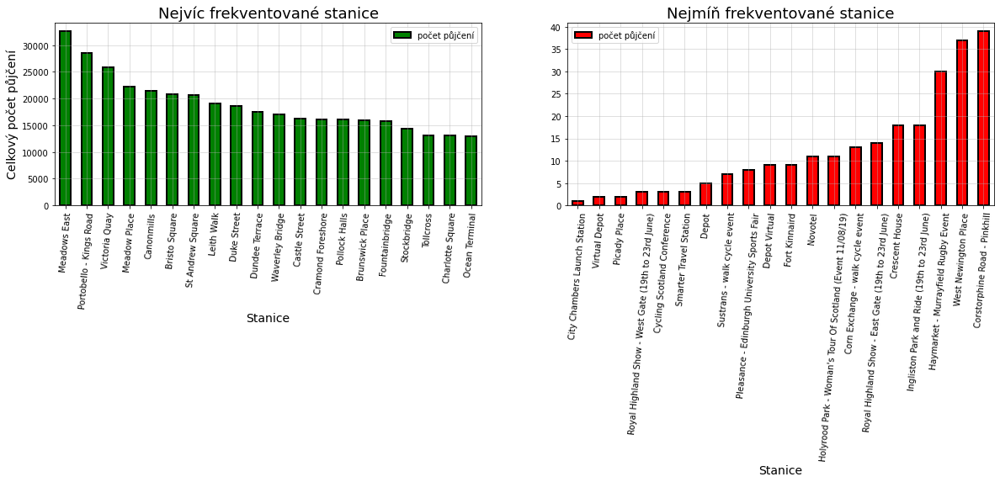

In [23]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,4))

spojena_graf1.plot.bar(ax=ax1, color='green', edgecolor='k', linewidth=2)
spojena_graf2.plot.bar(ax=ax2, color='red', edgecolor='k', linewidth=2)
ax1.set_xlabel('Stanice', fontsize=14)
ax1.set_xticklabels(spojena_graf1.index, rotation=85)
ax1.set_ylabel('Celkový počet půjčení', fontsize=14)
ax1.legend(['počet půjčení'])
ax1.grid(alpha=0.5)
ax1.set_title('Nejvíc frekventované stanice', fontsize=18)
ax2.set_xlabel('Stanice', fontsize=14)
ax2.set_xticklabels(spojena_graf2.index, rotation=85)
ax2.legend(['počet půjčení'])
ax2.grid(alpha=0.5)
ax2.set_title('Nejmíň frekventované stanice', fontsize=18)
plt.show()

# Identifikujte stanice, na kterých se kola hromadí a stanice, kde potenciálně chybí

Zde budu pracovat se jmény stanic místo ID pro přehlednost, ale prvně jsem ověřil že v roce 2021 souhlasí počet jmen s počtem ID. Nachystal jsem si tabulky na spojení tak, že v první je součet odjezdů z jednotlivých stanic a v druhé je součet příjezdů na jednotlivé stanice. Tabulky jsem spojil a ve spojené tabulce jsem vypočítal rozdíl mezi ukončenými a započatými jízdami. Tím jsem získal data, kde záporná čísla jsou hodnoty, kde potencionálně kola chybí, protože na dané stanici proběhlo víc půjčení než vrácení. Naopak kladná čísla jsou hodnoty kde se kola potencionálně hromadí.


In [24]:
bikes_df[['start_station_name', 'started_year']].query("started_year == 2021").nunique()

start_station_name    98
started_year           1
dtype: int64

In [25]:
bikes_df[['start_station_id', 'started_year']].query("started_year == 2021").nunique()

start_station_id    98
started_year         1
dtype: int64

In [26]:
bikes_df[['end_station_name', 'started_year']].query("started_year == 2021").nunique()

end_station_name    98
started_year         1
dtype: int64

In [27]:
bikes_df[['end_station_id', 'started_year']].query("started_year == 2021").nunique()

end_station_id    98
started_year       1
dtype: int64

In [28]:
df1 = (bikes_df[['start_station_name', 'started_at', 'started_year']]
       .query("started_year == 2021")
       .groupby('start_station_name')
       .count()
       .drop('started_year', axis=1)
       )
df2 = (bikes_df[['end_station_name', 'ended_at', 'ended_year']]
       .query("ended_year == 2021")
       .groupby('end_station_name')
       .count()
       .drop('ended_year', axis=1)
       )
missing_df = df1.join(df2)
missing_df = missing_df.assign(diff=missing_df['ended_at'] - missing_df['started_at'])

missing_df.sort_values('diff')

,started_at,ended_at,diff
start_station_name,,,
Pollock Halls,2597,1480,-1117
Meadow Place,2786,1952,-834
Bruntsfield Links,1729,939,-790
Meadows East,3169,2491,-678
City Chambers,829,329,-500
...,...,...,...
Canonmills,1403,1713,310
Cramond Foreshore,1337,1766,429
Victoria Quay,1946,2901,955


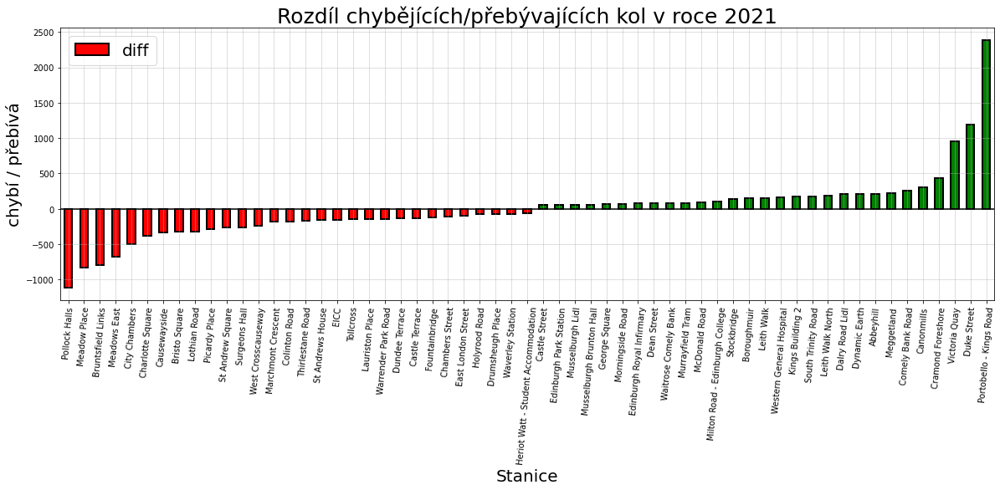

In [29]:
missing_df = (missing_df
              .sort_values('diff')
              .rename_axis('station')
              .loc[(missing_df['diff'] > 50) | (missing_df['diff'] < -50)]
              )

fig, ax = plt.subplots(figsize=(20,6))
colors = tuple(np.where(missing_df["diff"]>0, 'g', 'r'))

missing_df['diff'].plot.bar(ax=ax, color=colors, edgecolor='k', linewidth=2)

ax.set_title('Rozdíl chybějících/přebývajících kol v roce 2021', fontsize=25)
ax.set_xlabel('Stanice', fontsize=20)
ax.set_xticklabels(missing_df.index, rotation=85)
ax.set_ylabel('chybí / přebívá', fontsize=20)
ax.axhline(0, color='black')
ax.legend(fontsize=20)
ax.grid(alpha=0.5)

Dle poloh stanic na mapě je vidět, že kola se více půjčují v centru města a teoreticky se dá říct, že nejčastěji jsou jízdy k přímořským stanicím, odkud se už ale tolik nejezdí zpátky.

# Spočítejte vzdálenosti mezi jednotlivými stanicemi

Nachystal jsem tabulku s aktivními stanicemi v roce 2021. S pomocí návodu jsem spočítal vzdálenosti mezi stanicemi. Největší vzdálenost je cca 22,5km. Poté jsem udělal mapu kde jsou vykreslené vzdálenosti mezi všemi stanicemi v roce 2021.

In [30]:
distance_df = (bikes_df[['start_station_id', 'start_station_name', 'start_station_latitude', 'start_station_longitude', 'started_year']]
    .query("started_year == 2021")
    .drop('started_year', axis=1)
    .assign(start_rides=1)
    .groupby('start_station_name')
    .agg({'start_station_latitude': 'max', 'start_station_longitude': 'max', 'start_station_id': 'max', 'start_rides': 'sum'})
    .rename(columns={'start_station_latitude': 'lat', 'start_station_longitude': 'lng', 'start_station_id': 'station_id'})
    .rename_axis('station')
    ) 

distance_df.head()

,lat,lng,station_id,start_rides
station,,,,
Abbeyhill,55.955248,-3.172216,1814,856
Belford Road,55.951974,-3.226125,1093,212
Boroughmuir,55.940071,-3.215336,1823,760
Borrowman Square,55.982606,-3.381455,1864,23
Bristo Square,55.945834,-3.189053,248,1036


In [31]:
!pip install geopy
from geopy.distance import geodesic
from itertools import combinations

@np.vectorize
def geodesic_vec(lat1, lon1, lat2, lon2):
    rs = geodesic( (lat1, lon1), (lat2, lon2) ).kilometers
    return rs

coords = np.array(list(combinations(distance_df[['lat', 'lng']].values, 2)))
coords = coords.reshape(coords.shape[0], 4)
distances = geodesic_vec(coords[:, 0], coords[:, 1], coords[:, 2], coords[:, 3])

combos = list(combinations(distance_df.index, 2))
dist_df = pd.DataFrame(distances, index=pd.Index(combos, names=['station', 'station2']), columns=['distance'])
dist_df = dist_df.join(distance_df).join(distance_df.rename_axis('station2'), rsuffix='2')

In [32]:
dist_df[['distance']].sort_values('distance', ascending=False)

,,distance
station,station2,
Musselburgh Brunton Hall,Port Edgar Marina,22.456092
Hopetoun Road,Musselburgh Brunton Hall,22.228716
Forth Bridge Visitors Centre,Musselburgh Brunton Hall,22.116215
Musselburgh Lidl,Port Edgar Marina,21.947052
Port Edgar Marina,Queen Margaret University,21.939471
...,...,...
Bristo Square,Crichton Street,0.177891
Kings Building 2,Kings Buildings 1,0.175033
Crichton Street,West Crosscauseway,0.161452


In [33]:
distance_map = folium.Map(distance_df[['lat', 'lng']].mean(), width='90%', height='100%', zoom_start=11)

plugins.ScrollZoomToggler().add_to(distance_map)

for station, row in distance_df.iterrows():
  folium.Marker(row[['lat', 'lng']].values.tolist(),
                  popup=folium.Popup(f"""ID stanice: {int(row['station_id'])} <br>
                   Nazev stanice: {station}""", max_width=500),
                  icon=folium.Icon(icon='bicycle', prefix='fa', color='green')
                  ).add_to(distance_map)

for (station, station2), row in dist_df.iterrows():
    folium.PolyLine([row[['lat', 'lng']].values.tolist(), row[['lat2', 'lng2']].values.tolist()], 
                    popup=folium.Popup(f"{station} to {station2}: {int(row['distance'])} kilometers", max_width=500), 
                    opacity=0.15, 
                    color='black'
                   ).add_to(distance_map)


distance_map

Pro druhou mapu jsem nachytal tabulku patnácti nejaktivnějších stanic a zobrazil vzdálenosti mezi nimy. Je to ilustrace toho, kde se nejvíce jezdí.

In [34]:
distance_df2 = (bikes_df[['start_station_id', 'start_station_name', 'start_station_latitude', 'start_station_longitude', 'started_year']]
    .assign(start_rides=1)
    .groupby('start_station_name')
    .agg({'start_station_latitude': 'max', 'start_station_longitude': 'max', 'start_station_id': 'max', 'started_year': 'max', 'start_rides': 'sum'})
    .rename(columns={'start_station_latitude': 'lat', 'start_station_longitude': 'lng','start_station_id': 'station_id'})
    .rename_axis('station')
    )

end_rides1 = bikes_df[['end_station_name', 'ended_at']].groupby('end_station_name').count().rename(columns={'ended_at': 'end_rides'}).rename_axis('station')

distance_df2 = distance_df2.join(end_rides1).fillna(0)

distance_df2 = active_df.sort_values('start_rides', ascending=False).head(15)

In [37]:
from geopy.distance import geodesic
from itertools import combinations

@np.vectorize
def geodesic_vec(lat1, lon1, lat2, lon2):
    rs = geodesic( (lat1, lon1), (lat2, lon2) ).kilometers
    return rs

coords1 = np.array(list(combinations(distance_df2[['lat', 'lng']].values, 2)))
coords1 = coords1.reshape(coords1.shape[0], 4)
distances = geodesic_vec(coords1[:, 0], coords1[:, 1], coords1[:, 2], coords1[:, 3])

combos1 = list(combinations(distance_df2.index, 2))
dist_df2 = pd.DataFrame(distances, index=pd.Index(combos1, names=['station', 'station2']), columns=['distance'])
dist_df2 = dist_df2.join(distance_df2).join(distance_df2.rename_axis('station2'), rsuffix='2')


In [38]:
dist_df2[['distance']].sort_values('distance', ascending=False)

distance
station                 station2                         
Portobello - Kings Road Dundee Terrace           6.701728
                        Fountainbridge           5.906474
                        Charlotte Square         5.579664
                        Castle Street            5.348236
Meadow Place            Portobello - Kings Road  5.152210
...                                                   ...
Meadows East            Pollock Halls            0.697594
Bristo Square           Waverley Bridge          0.687344
Leith Walk              Brunswick Place          0.560042
St Andrew Square        Waverley Bridge          0.331877
Castle Street           Charlotte Square         0.261767

[105 rows x 1 columns]

In [39]:
distance_map2 = folium.Map(distance_df2[['lat', 'lng']].mean(), width='90%', height='100%', zoom_start=13)

plugins.ScrollZoomToggler().add_to(distance_map2)

for station, row in distance_df2.iterrows():
    popup=folium.Popup(f"""ID stanice: {int(row['station_id'])} <br>
                   Nazev stanice: {station} <br>
                   Pocet jizd: {int(row['start_rides'])} <br>
                   Pocet prijezdu na stanici: {int(row['end_rides'])}
                   """, max_width=500)
    folium.Marker(row[['lat', 'lng']].values.tolist(),
                  popup=popup,
                  icon=folium.Icon(icon='bicycle', prefix='fa', color='green')
                  ).add_to(distance_map2)                                                
    

for (station, station2), row in dist_df2.iterrows():
    folium.PolyLine([row[['lat', 'lng']].values.tolist(), row[['lat2', 'lng2']].values.tolist()], 
                    popup=folium.Popup(f"{station} to {station2}: {int(row['distance'])} kilometers", max_width=500), 
                    opacity=0.15, 
                    color='black'
                   ).add_to(distance_map2)


distance_map2

# Jak dlouho trvá jedna výpůjčka? Najděte odlehlé hodnoty, zobrazte histogram

Díky funkci převodu času vidím, že nejdelší vypůjčka trvala přes 27 dní. Další dvě trvaly přes 11 dní a tři přes týden. V zobrazených 70 záznamech jsou vidět vypůjčky co trvaly více než jeden den. Pro zobrazení histogramu jsem omezil čas vypůjček nad 15000s (4 hodiny 10 minut). Celkově ubylo 1961 záznamů(pro rok 2018: 82, 2019: 490, 2020: 1187, 2021: 202). Nachystal jsem si tabulky podle jednotlivých roků, celkovou a pro všechny zobrazil histogramy.

In [40]:
def convert(seconds):
    day = seconds // (24 * 3600)
    seconds = seconds % (24 * 3600)
    hour = seconds // 3600
    seconds %= 3600
    minutes = seconds // 60
    seconds %= 60
      
    return "%02d:%02d:%02d:%02d" % (day, hour, minutes, seconds)

bikes_df['duration2'] = bikes_df['duration'].apply(convert)

In [41]:
cas = bikes_df[['duration2']].sort_values('duration2', ascending=False).head(70)
cas

,duration2
12423,27:08:29:08
141002,11:22:53:58
13026,11:13:59:10
161588,08:02:46:08
14913,07:23:20:32
...,...
44973,01:00:45:30
44971,01:00:37:26
19924,01:00:23:46
121158,01:00:02:51


In [42]:
aaa = 15000
print(convert(aaa))

00:04:10:00


In [43]:
bikes_df[['duration', 'started_year']].query("started_year == 2018").query("duration >= 15000").count()

duration        82
started_year    82
dtype: int64

In [44]:
bikes_df[['duration', 'started_year']].query("started_year == 2019").query("duration >= 15000").count()

duration        490
started_year    490
dtype: int64

In [45]:
bikes_df[['duration', 'started_year']].query("started_year == 2020").query("duration >= 15000").count()

duration        1187
started_year    1187
dtype: int64

In [46]:
bikes_df[['duration', 'started_year']].query("started_year == 2021").query("duration >= 15000").count()

duration        202
started_year    202
dtype: int64

In [47]:
r21 = bikes_df[['duration', 'started_year']].query('started_year == 2021').query("duration <= 15000").drop('started_year', axis=1)
r20 = bikes_df[['duration', 'started_year']].query('started_year == 2020').query("duration <= 15000").drop('started_year', axis=1)
r19 = bikes_df[['duration', 'started_year']].query('started_year == 2019').query("duration <= 15000").drop('started_year', axis=1)
r18 = bikes_df[['duration', 'started_year']].query('started_year == 2018').query("duration <= 15000").drop('started_year', axis=1)
celkove = bikes_df[['duration']].query("duration <= 15000")

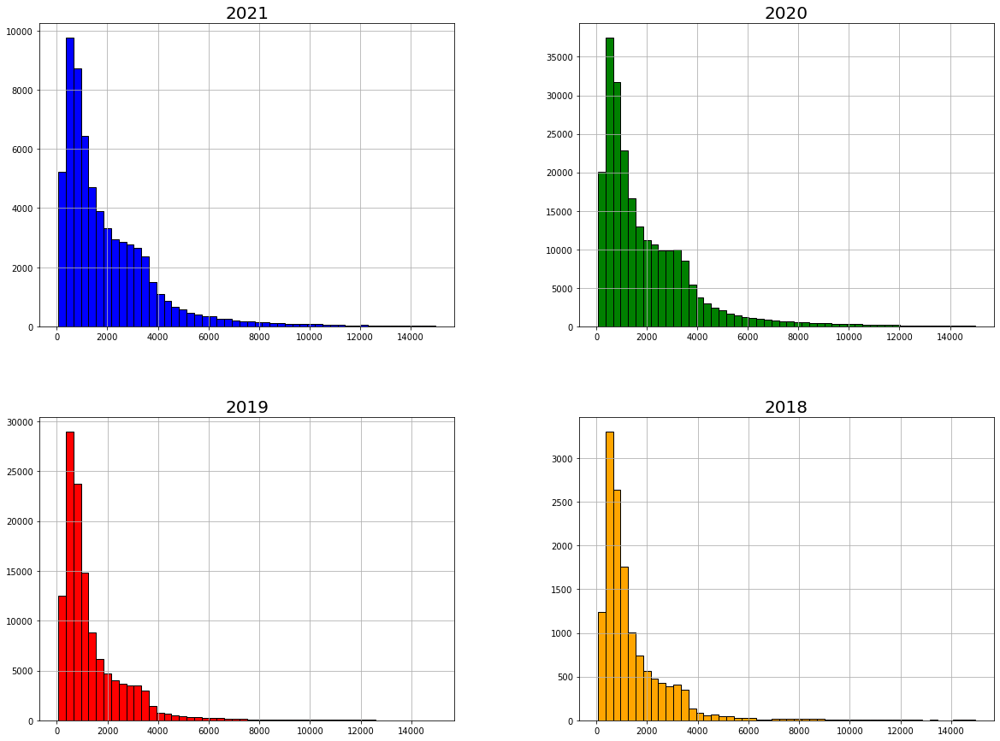

In [48]:
fig = plt.figure(figsize=(20,15))
ax1 = plt.subplot2grid((2,2), (0,0), fig=fig)
ax2 = plt.subplot2grid((2,2), (0,1), fig=fig)
ax3 = plt.subplot2grid((2,2), (1,0), fig=fig)
ax4 = plt.subplot2grid((2,2), (1,1), fig=fig)

r21.hist(ax=ax1, bins=50, color='blue', edgecolor='k')
r20.hist(ax=ax2, bins=50, color='green', edgecolor='k')
r19.hist(ax=ax3, bins=50, color='red', edgecolor='k')
r18.hist(ax=ax4, bins=50, color='orange', edgecolor='k')

ax1.set_title('2021', fontsize=20)
ax2.set_title('2020', fontsize=20)
ax3.set_title('2019', fontsize=20)
ax4.set_title('2018', fontsize=20)

plt.show()

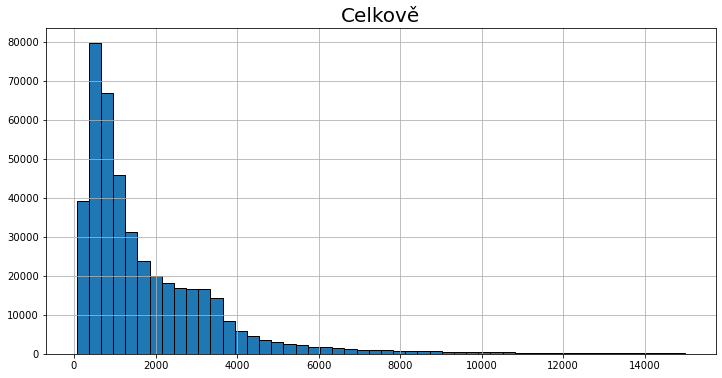

In [49]:
fig, ax = plt.subplots(figsize=(12,6))

celkove.hist(ax=ax, bins=50, edgecolor='k')
ax.set_title('Celkově', fontsize=20)

plt.show()

Je vidět, že nejvíce vypůjček trvalo do 2000 sekund, což je cca 33 minut. Předpokládám, že jsou kola nejčastěji používána k rychlému přesunu po městě.

# Zobrazte vývoj poptávky po půjčování kol v čase

Nachystal jsem tabulky tak, že jsem zgrupoval podle roku, měsíce a dne jednu a podle roku a měsíce druhou. Do obou grafů jsem vložil přímku, aby byl znázorněn vývojový trend vypůjček kol.

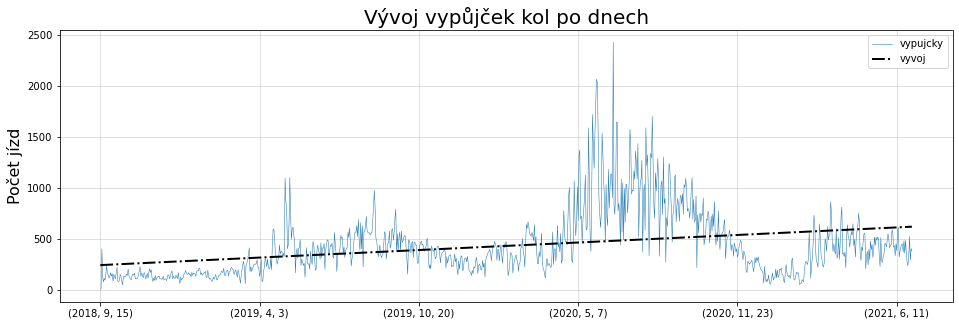

In [50]:
day_df = bikes_df[['started_year', 'started_month', 'started_day', 'started_at']].groupby(['started_year', 'started_month', 'started_day']).count()
time = np.arange(day_df.shape[0])
b, a = np.polyfit(time, day_df['started_at'], deg=1).round(2)
day_df['vyvoj'] = a+b*time
day_df['vypujcky'] = day_df['started_at']

fig, ax = plt.subplots(figsize=(16,5))

day_df['vypujcky'].plot(ax=ax, linewidth=0.5)
day_df['vyvoj'].plot(ax=ax, linestyle='-.', linewidth=2, color='k')

ax.set_title('Vývoj vypůjček kol po dnech', fontsize=20)
ax.set_ylabel('Počet jízd', fontsize=16)
ax.set_xlabel('')
ax.grid(alpha=0.5)
ax.legend()

plt.show()

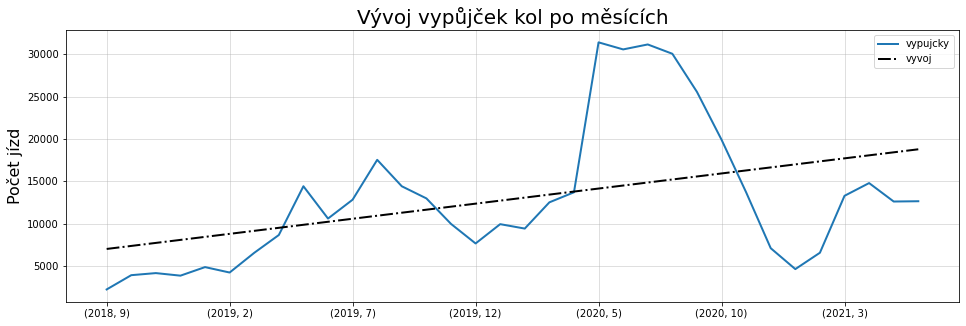

In [51]:
month_df = bikes_df[['started_year', 'started_month', 'started_at']].groupby(['started_year', 'started_month']).count()
time = np.arange(month_df.shape[0])
b, a = np.polyfit(time, month_df['started_at'], deg=1).round(2)
month_df['vyvoj'] = a+b*time
month_df['vypujcky'] = month_df['started_at']

fig, ax = plt.subplots(figsize=(16,5))

month_df['vypujcky'].plot(ax=ax, linewidth=2)
month_df['vyvoj'].plot(ax=ax, linestyle='-.', linewidth=2, color='k')

ax.set_title('Vývoj vypůjček kol po měsících', fontsize=20)
ax.set_ylabel('Počet jízd', fontsize=16)
ax.set_xlabel('')
ax.grid(alpha=0.5)
ax.legend()

plt.show()

Z obou grafů je vidět, že vývoj poptávky má stoupající tendenci. Dá se předpokládat, že poptávka po kolech bude ještě nějaký čas stoupat.

# Identifikujte příčiny výkyvů poptávky

Z dostupných dat nejsem schopen určit příčiny výkyvů, kromě vlivu počasí, kterému se věnuji níže. Dá se ovšem říci, že nejviditelnější narůst vypujček je během letních měsíců. Nejviditelnější pokles je pak během zimních měsíců.

# Zjistěte vliv počasí na poptávku po kolech

Po načtení tabulky o počasí v Edinburghu je vidět, že všechny hodnoty jsou typu object. Takže datum jsem převedl na datetime typ, aby s ním šlo pracovat. Počátční datum jsem nastavil na datum první vypůjčky kola. Na ostatní hodnoty o počasí jsem použil funkce na ořezání stringu tak, aby mi zůstaly jen číselné hodnoty. Neberu zde v potaz čas, použiji denní průměr jednotlivých hodnot, který ale zaokrouhlím. Teploty zaokrouhleny po půl stupních. Srážky po 0,1 mm, oblačnost a vlhkost po 5%. Rychlosti větru po 1 km/h a tlak po 5 mb. Podle vhodně zaokrouhlených hodnot zgrupuji vypůjčky. Jako jedinný sloupec mi zůstane sloupec s popisem viditelnosti, se kterým budu pracovat nakonec.

In [52]:
weather_df = pd.read_csv('edinburgh_weather.csv')
weather_df.head()

,Unnamed: 0,time,temp,feels,wind,gust,rain,humidity,cloud,pressure,vis,date
0,0,00:00,11 °c,11 °c,9 km/h from S,19 km/h,0.0 mm,79%,13%,1020 mb,Excellent,2018-09-01
1,1,03:00,13 °c,12 °c,11 km/h from SSW,19 km/h,0.0 mm,76%,96%,1020 mb,Excellent,2018-09-01
2,2,06:00,14 °c,13 °c,11 km/h from SSW,19 km/h,0.0 mm,84%,100%,1020 mb,Excellent,2018-09-01
3,3,09:00,14 °c,13 °c,14 km/h from SSW,23 km/h,0.1 mm,88%,78%,1021 mb,Excellent,2018-09-01
4,4,12:00,16 °c,16 °c,15 km/h from SSW,22 km/h,0.0 mm,87%,87%,1021 mb,Excellent,2018-09-01


In [53]:
weather_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8272 entries, 0 to 8271
Data columns (total 12 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   Unnamed: 0  8272 non-null   int64 
 1   time        8272 non-null   object
 2   temp        8272 non-null   object
 3   feels       8272 non-null   object
 4   wind        8272 non-null   object
 5   gust        8272 non-null   object
 6   rain        8272 non-null   object
 7   humidity    8272 non-null   object
 8   cloud       8272 non-null   object
 9   pressure    8272 non-null   object
 10  vis         8272 non-null   object
 11  date        8272 non-null   object
dtypes: int64(1), object(11)
memory usage: 775.6+ KB


In [54]:
weather_df['date'] = pd.to_datetime(weather_df['date'])
weather_df['temp'] = weather_df['temp'].transform(lambda x: x.rstrip('°c')).astype(int)
weather_df['feels'] = weather_df['feels'].transform(lambda x: x.rstrip('°c')).astype(int)
weather_df['wind'] = weather_df['wind'].transform(lambda x: x.str.slice(stop=2)).astype(int)
weather_df['gust'] = weather_df['gust'].transform(lambda x: x.rstrip(' km/h')).astype(int)
weather_df['rain'] = weather_df['rain'].transform(lambda x: x.rstrip(' mm')).astype(float)
weather_df['cloud'] = weather_df['cloud'].transform(lambda x: x.rstrip('%')).astype(int)
weather_df['humidity'] = weather_df['humidity'].transform(lambda x: x.rstrip('%')).astype(int)
weather_df['pressure'] = weather_df['pressure'].transform(lambda x: x.rstrip(' mb')).astype(int)
weather_df = weather_df.query("date >= '2018-09-15'")

In [55]:
weather_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8160 entries, 112 to 8271
Data columns (total 12 columns):
 #   Column      Non-Null Count  Dtype         
---  ------      --------------  -----         
 0   Unnamed: 0  8160 non-null   int64         
 1   time        8160 non-null   object        
 2   temp        8160 non-null   int32         
 3   feels       8160 non-null   int32         
 4   wind        8160 non-null   int32         
 5   gust        8160 non-null   int32         
 6   rain        8160 non-null   float64       
 7   humidity    8160 non-null   int32         
 8   cloud       8160 non-null   int32         
 9   pressure    8160 non-null   int32         
 10  vis         8160 non-null   object        
 11  date        8160 non-null   datetime64[ns]
dtypes: datetime64[ns](1), float64(1), int32(7), int64(1), object(2)
memory usage: 605.6+ KB


In [56]:
weather_df2 = (weather_df
               .groupby('date').mean()
               .drop('Unnamed: 0', axis=1)
               .rename(columns={'temp': 'Teplota', 'feels': 'Pocitova teplota', 'wind': 'Vitr', 'gust': 'Narazy vetru',
                                'rain': 'Dest', 'humidity': 'Vlhkost', 'cloud': 'Oblacnost', 'pressure': 'Tlak'}))
weather_df2.head()

,Teplota,Pocitova teplota,Vitr,Narazy vetru,Dest,Vlhkost,Oblacnost,Tlak
date,,,,,,,,
2018-09-15,10.500,8.500,14.875,23.500,0.1250,83.875,58.125,1017.375
2018-09-16,12.875,10.625,26.500,43.125,0.1250,81.500,79.500,1008.875
2018-09-17,13.875,13.125,18.000,29.875,0.0250,83.000,66.125,1006.375
2018-09-18,14.125,13.500,16.875,28.500,0.2375,86.875,57.750,996.125
2018-09-19,11.750,8.625,34.750,55.625,0.3625,75.750,52.250,995.875


Pro práci jsem si z tabulky o vypůjčách zgrupoval podle data počet vypůjček, ke které jsem připojil průměrné hodnoty o počasí, které vhodně zaokrouhlím.

In [57]:
pujcky = bikes_df[['started_date', 'started_at']].groupby('started_date').count().rename(columns={'started_at': 'Vypujcky'})
pujcky.head()

,Vypujcky
started_date,
2018-09-15,3
2018-09-16,10
2018-09-17,403
2018-09-18,126
2018-09-19,77


In [58]:
pocasi_df = pujcky.join(weather_df2)
pocasi_df.head()

,Vypujcky,Teplota,Pocitova teplota,Vitr,Narazy vetru,Dest,Vlhkost,Oblacnost,Tlak
started_date,,,,,,,,,
2018-09-15,3,10.500,8.500,14.875,23.500,0.1250,83.875,58.125,1017.375
2018-09-16,10,12.875,10.625,26.500,43.125,0.1250,81.500,79.500,1008.875
2018-09-17,403,13.875,13.125,18.000,29.875,0.0250,83.000,66.125,1006.375
2018-09-18,126,14.125,13.500,16.875,28.500,0.2375,86.875,57.750,996.125
2018-09-19,77,11.750,8.625,34.750,55.625,0.3625,75.750,52.250,995.875


In [59]:
pocasi_df['Teplota'] = pocasi_df['Teplota'].transform(lambda x: round(x * 2.0) / 2.0)
pocasi_df['Pocitova teplota'] = pocasi_df['Pocitova teplota'].transform(lambda x: round(x * 2.0) / 2.0)
pocasi_df['Dest'] = pocasi_df['Dest'].transform(lambda x: 0.1 * round(x/0.1))
pocasi_df['Oblacnost'] = pocasi_df['Oblacnost'].transform(lambda x: 5 * round(x/5))
pocasi_df['Vitr'] = pocasi_df['Vitr'].transform(lambda x: 1 * round(x/1))
pocasi_df['Narazy vetru'] = pocasi_df['Narazy vetru'].transform(lambda x: 1 * round(x/1))
pocasi_df['Vlhkost'] = pocasi_df['Vlhkost'].transform(lambda x: 5 * round(x/5))
pocasi_df['Tlak'] = pocasi_df['Tlak'].transform(lambda x: 5 * round(x/5))
pocasi_df.head()

,Vypujcky,Teplota,Pocitova teplota,Vitr,Narazy vetru,Dest,Vlhkost,Oblacnost,Tlak
started_date,,,,,,,,,
2018-09-15,3,10.5,8.5,15,24,0.1,85,60,1015
2018-09-16,10,13.0,10.5,26,43,0.1,80,80,1010
2018-09-17,403,14.0,13.0,18,30,0.0,85,65,1005
2018-09-18,126,14.0,13.5,17,28,0.2,85,60,995
2018-09-19,77,12.0,8.5,35,56,0.4,75,50,995


In [60]:
teplota = pocasi_df[['Teplota', 'Vypujcky']].groupby('Teplota').sum().reset_index()
pocitova = pocasi_df[['Pocitova teplota', 'Vypujcky']].groupby('Pocitova teplota').sum().reset_index()
dest = pocasi_df[['Dest', 'Vypujcky']].groupby('Dest').sum().reset_index()
oblacnost = pocasi_df[['Oblacnost', 'Vypujcky']].groupby('Oblacnost').sum().reset_index()
vitr = pocasi_df[['Vitr', 'Vypujcky']].groupby('Vitr').sum().reset_index()
narazy = pocasi_df[['Narazy vetru', 'Vypujcky']].groupby('Narazy vetru').sum().reset_index()
vlhkost = pocasi_df[['Vlhkost', 'Vypujcky']].groupby('Vlhkost').sum().reset_index()
tlak = pocasi_df[['Tlak', 'Vypujcky']].groupby('Tlak').sum().reset_index()

Jako graf jsem zvolil scatter plot, na kterém je nejlépe vidět vliv jednotlivých atributů počasí na vypůjčky.

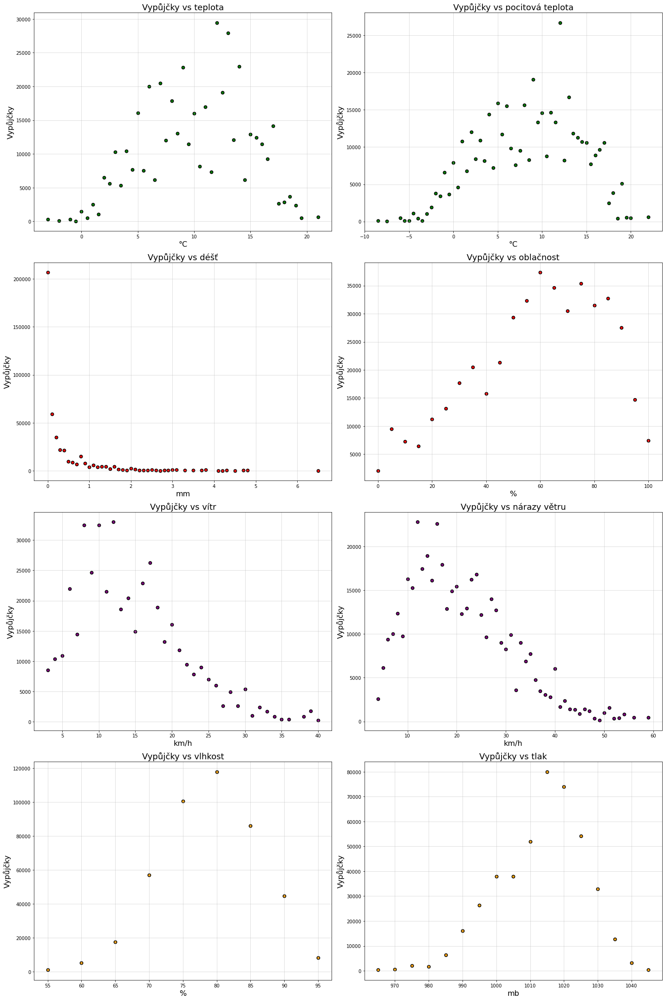

In [61]:
fig, (ax1, ax2, ax3, ax4) = plt.subplots(4,2, figsize=(20,30))

ax1[0].scatter(teplota['Teplota'], teplota['Vypujcky'], s=40, color='green', edgecolor='k', linewidth=1.5)
ax1[0].set_title('Vypůjčky vs teplota', fontsize=18)
ax1[0].set_ylabel('Vypůjčky', fontsize=16)
ax1[0].set_xlabel('°C', fontsize=16)
ax1[0].grid(alpha=0.5)

ax1[1].scatter(pocitova['Pocitova teplota'], pocitova['Vypujcky'], s=40, color='green', edgecolor='k', linewidth=1.5)
ax1[1].set_title('Vypůjčky vs pocitová teplota', fontsize=18)
ax1[1].set_ylabel('Vypůjčky', fontsize=16)
ax1[1].set_xlabel('°C', fontsize=16)
ax1[1].grid(alpha=0.5)

ax2[0].scatter(dest['Dest'], dest['Vypujcky'], s=40, color='red', edgecolor='k', linewidth=1.5)
ax2[0].set_title('Vypůjčky vs déšť', fontsize=18)
ax2[0].set_ylabel('Vypůjčky', fontsize=16)
ax2[0].set_xlabel('mm', fontsize=16)
ax2[0].grid(alpha=0.5)

ax2[1].scatter(oblacnost['Oblacnost'], oblacnost['Vypujcky'], s=40, color='red', edgecolor='k', linewidth=1.5)
ax2[1].set_title('Vypůjčky vs oblačnost', fontsize=18)
ax2[1].set_ylabel('Vypůjčky', fontsize=16)
ax2[1].set_xlabel('%', fontsize=16)
ax2[1].grid(alpha=0.5)

ax3[0].scatter(vitr['Vitr'], vitr['Vypujcky'], s=40, color='purple', edgecolor='k', linewidth=1.5)
ax3[0].set_title('Vypůjčky vs vítr', fontsize=18)
ax3[0].set_ylabel('Vypůjčky', fontsize=16)
ax3[0].set_xlabel('km/h', fontsize=16)
ax3[0].grid(alpha=0.5)

ax3[1].scatter(narazy['Narazy vetru'], narazy['Vypujcky'], s=40, color='purple', edgecolor='k', linewidth=1.5)
ax3[1].set_title('Vypůjčky vs nárazy větru', fontsize=18)
ax3[1].set_ylabel('Vypůjčky', fontsize=16)
ax3[1].set_xlabel('km/h', fontsize=16)
ax3[1].grid(alpha=0.5)

ax4[0].scatter(vlhkost['Vlhkost'], vlhkost['Vypujcky'], s=40, color='orange', edgecolor='k', linewidth=1.5)
ax4[0].set_title('Vypůjčky vs vlhkost', fontsize=18)
ax4[0].set_ylabel('Vypůjčky', fontsize=16)
ax4[0].set_xlabel('%', fontsize=16)
ax4[0].grid(alpha=0.5)

ax4[1].scatter(tlak['Tlak'], tlak['Vypujcky'], s=40, color='orange', edgecolor='k', linewidth=1.5)
ax4[1].set_title('Vypůjčky vs tlak', fontsize=18)
ax4[1].set_ylabel('Vypůjčky', fontsize=16)
ax4[1].set_xlabel('mb', fontsize=16)
ax4[1].grid(alpha=0.5)

fig.tight_layout()
plt.show()

Pro zobrazení počtu dní a jejich viditelnosti jsem sloupec s viditelností zgrupoval podle data a poté provedl součet hodnot a vložil jsem výsledek do bar chartu.

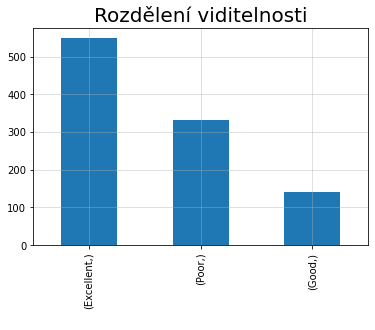

In [62]:
viditelnost = weather_df[['date', 'vis']].groupby('date').max().value_counts()

fig, ax = plt.subplots()
viditelnost.plot.bar(ax=ax)
ax.set_title('Rozdělení viditelnosti', fontsize=20)
ax.set_xlabel(' ')
ax.grid(alpha=0.5)

plt.show()

# Půjčují si lidé kola více o víkendu než během pracovního týdne?

Jako první tabulku jsem si připravil celkový počet jízd po dnech. Druhou tabulku jsem upravil tak, že jsem sečetl celkový počet jízd o víkendu a pracovních dnech, potom převedl a spojil tak, abych dostal výslednou tabulku o 2 řádcích. Poté jsem druhou tabulku přepočítal jako vážený průměr. Výsledná data jsem převedl na koláčové grafy.

In [63]:
days_df = (bikes_df[['started_at', 'started_weekend']]
             .groupby('started_weekend').count()
             .rename(columns={'started_at': 'celkem_jizd'}))

days_df

,celkem_jizd
started_weekend,
0,57949
1,58662
2,59605
3,60809
4,63339
5,70865
6,67030


In [64]:
df = (bikes_df[['started_at', 'started_weekend']]
             .groupby('started_weekend').count()
             .rename(columns={'started_at': 'celkem_jizd'}))

mask = [5, 6]
mask2 = [0, 1, 2, 3, 4]

weekend = df[['celkem_jizd']].loc[mask].sum()
work_day = df[['celkem_jizd']].loc[mask2].sum()

a = pd.DataFrame(weekend).rename(columns={0: 'Víkend'})
b = pd.DataFrame(work_day).rename(columns={0: 'Pracovní den'})

weekend_df = a.join(b)
weekend_df = weekend_df.transpose()
weekend_df

,celkem_jizd
Víkend,137895
Pracovní den,300364


In [65]:
df1 = (bikes_df[['started_at', 'started_weekend']]
             .groupby('started_weekend').count()
             .rename(columns={'started_at': 'celkem_jizd'}))

mask1 = [5, 6]
mask12 = [0, 1, 2, 3, 4]

weekend1 = df1[['celkem_jizd']].loc[mask1].sum()
work_day1 = df1[['celkem_jizd']].loc[mask12].sum()

a1 = pd.DataFrame(weekend1).rename(columns={0: 'Víkend'}) / 2
b1 = pd.DataFrame(work_day1).rename(columns={0: 'Pracovní den'}) / 5

weekend_df1 = a1.join(b1)
weekend_df1 = weekend_df1.transpose()
weekend_df1

,celkem_jizd
Víkend,68947.5
Pracovní den,60072.8


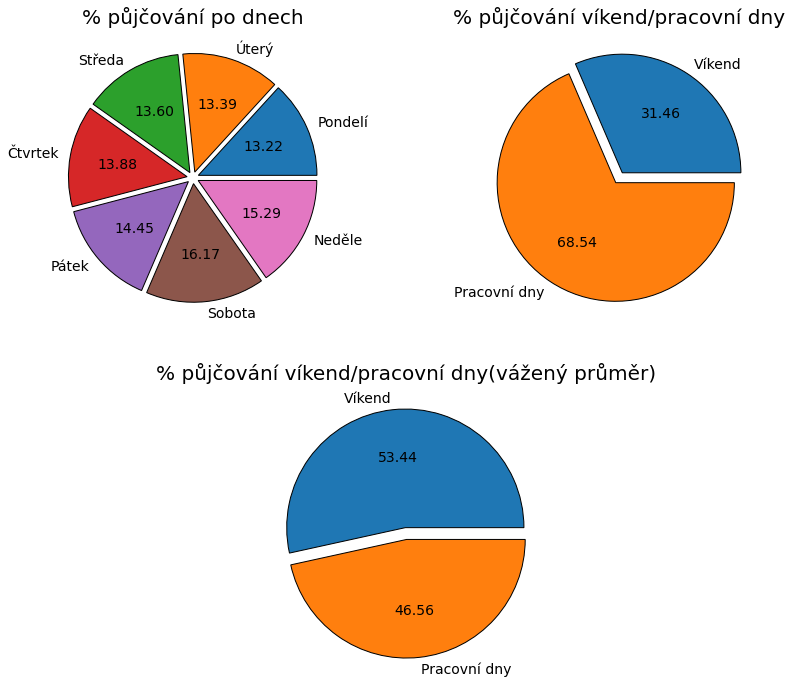

In [66]:
fig = plt.figure(figsize=(14,12))
ax1 = plt.subplot2grid((2,2), (0,0), fig=fig)
ax2 = plt.subplot2grid((2,2), (0,1), fig=fig)
ax3 = plt.subplot2grid((2,2), (1,0),colspan=2, fig=fig)

pie_kwargs = {'wedgeprops': {'edgecolor': 'black'}, 'textprops': {'fontsize': 14}, 'autopct': '%.2f'}
labels = ['Pondelí', 'Úterý', 'Středa', 'Čtvrtek', 'Pátek', 'Sobota', 'Neděle']
labels2 = ['Víkend', 'Pracovní dny']

ax1.pie(days_df['celkem_jizd'],
        labels=labels, 
        explode=np.repeat(0.05, days_df.shape[0]),
        **pie_kwargs)

ax2.pie(weekend_df['celkem_jizd'],
        labels=labels2,
        explode=np.repeat(0.05, weekend_df.shape[0]),
        **pie_kwargs)

ax3.pie(weekend_df1['celkem_jizd'],
        labels=labels2,
        explode=np.repeat(0.05, weekend_df.shape[0]),
        **pie_kwargs)

ax1.set_title('% půjčování po dnech', fontsize=20)
ax2.set_title('% půjčování víkend/pracovní dny', fontsize=20)
ax3.set_title('% půjčování víkend/pracovní dny(vážený průměr)', fontsize=20)


plt.show()

Když se podívám na jednotlivé dny, tak je vidět, že nejaktivnější jsou sobota a nedelě. Pokud se na to ale podívám v poměru víkend/pracovní dny, tak je jasně vidět, že pracovní dny převažují. Dá se soudit, že lidé používají kola v týdnu k přesunu po městě např. do zaměstnání nebo školy atd. A podle zobrazení váženého průměru je vidět, že víkend lehce převládá, ale je to vcelku vyrovnané.